In [1]:
# Import necessary modules
# We have stored our dataset in Google Drive so we need to mount it to access the datasetimport os
import os
import zipfile
from google.colab import drive
from keras.preprocessing.image import ImageDataGenerator

In [5]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Specify the path to the zip file and the extraction path
zip_path = '/content/drive/My Drive/Group_5_water_slight.zip'
extract_path = '/content/dataset/'

In [7]:
# Creates a directory at the specified path if it doesn't already exist.
#Parameters: extract_path (str): The path of the directory to be created

os.makedirs(extract_path, exist_ok=True)

In [8]:
# Extract the dataset
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [9]:
# Check the content of the extracted directory
extracted_files = os.listdir(extract_path)
print("Extracted files:", extracted_files)

Extracted files: ['Group_5_water_slight']


In [ ]:
"""
This code block defines the file paths for the training, validation, and test datasets.

Parameters:
- extract_path (str): The base path where the datasets are extracted.

Returns:
- train_path (str): The file path for the training dataset.
- validation_path (str): The file path for the validation dataset.
- test_path (str): The file path for the test dataset.
"""
train_path = os.path.join(extract_path, 'Group_5_water_slight','train')
validation_path = os.path.join(extract_path, 'Group_5_water_slight','valid')
test_path = os.path.join(extract_path, 'Group_5_water_slight','test')


In [12]:
"""
We will use the image data generator,
because its useful for handling large datasets that may not fit into memory all at once,
allowing for the dynamic and on-the-fly preprocessing of images as they are passed to the model.

Here, we are doing real-time data preprocessing:
rescaling the pixel values of the images to the range [0, 1].
resizing the images to the 224,244 dimensions
and creating batches of 32 images.
"""
image_datagen = ImageDataGenerator(rescale=1./255)
image_height, image_width = 224, 224
batch_size = 32

In [13]:
"""
Creates a generator for training data from a directory of images.

Parameters:
- train_path (str): The path to the directory containing the training images.
- target_size (tuple): The desired size of the images after resizing.
- batch_size (int): The number of samples per batch.
- class_mode (str): The type of label array to return. Set to 'categorical' for one-hot encoded labels.

Returns:
- train_generator: A generator that yields batches of training data.
"""
train_generator = image_datagen.flow_from_directory(
    train_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 15259 images belonging to 3 classes.


In [14]:
"""
Create a generator for validation data.

Parameters:
- validation_path (str): The path to the directory containing the validation images.
- target_size (tuple): The desired size of the images after resizing.
- batch_size (int): The number of samples per batch.
- class_mode (str): The type of classification task. Set to 'categorical' for multi-class classification.

Returns:
- A generator that yields batches of validation data.
"""
valid_generator = image_datagen.flow_from_directory(
    validation_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 1890 images belonging to 3 classes.


In [15]:
"""
Create a generator for test data.

Parameters:
- test_path (str): The path to the directory containing the validation images.
- target_size (tuple): The desired size of the images after resizing.
- batch_size (int): The number of samples per batch.
- class_mode (str): The type of classification task. Set to 'categorical' for multi-class classification.

Returns:
- A generator that yields batches of test data.
"""
test_generator = image_datagen.flow_from_directory(
    test_path,
    target_size=(image_height, image_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 2400 images belonging to 3 classes.


In [17]:
# Import the Image module from the PIL library
from PIL import Image
# Define a function to explore image sizes in a folder
def explore_image_sizes(folder):
    dimensions = {}
    for subdir, dirs, files in os.walk(folder):
        for file in files:
            if file.endswith('.jpg'):
                path = os.path.join(subdir, file)
                with Image.open(path) as img:
                    width, height = img.size
                    dimensions[path] = (width, height)
    return dimensions

In [18]:
# We can see that all the images in the training dataset have the same dimensions of 240 x 360 pixels.
# We will resize the images to 224 x 224 pixels during the training process.
train_dimensions = explore_image_sizes(train_path) #list(d.items())[:4]
print(list(train_dimensions.items())[:4])

[('/content/dataset/Group_5_water_slight/train/water_asphalt_slight/20220723205821125-water-asphalt-slight.jpg', (240, 360)), ('/content/dataset/Group_5_water_slight/train/water_asphalt_slight/202205041241116-water-asphalt-slight.jpg', (240, 360)), ('/content/dataset/Group_5_water_slight/train/water_asphalt_slight/2022072321012529-water-asphalt-slight.jpg', (240, 360)), ('/content/dataset/Group_5_water_slight/train/water_asphalt_slight/20220715002815600-water-asphalt-slight.jpg', (240, 360))]


In [40]:
def visualize_samples(path, num_samples=5):
    # Find all subdirectories in the path
    subdirs = [subdir for subdir in os.listdir(path) if os.path.isdir(os.path.join(path, subdir))]

    # Calculate the number of subplots needed
    num_subdirs = len(subdirs)
    fig, axes = plt.subplots(num_subdirs, num_samples, figsize=(20, 10))

    # Check if we have more than one subdir to adjust the axes indexing
    if num_subdirs == 1:
        axes = [axes]  # Encapsulate it in a list to make it iterable

    # Iterate over all subdirectories
    for i, subdir in enumerate(subdirs):
        # Get 'num_samples' samples from each subdir
        samples = os.listdir(os.path.join(path, subdir))[:num_samples]

        # Iterate over each sample
        for j, sample in enumerate(samples):
            img_path = os.path.join(path, subdir, sample)
            img = Image.open(img_path)

            # Handle both cases where we have a single row of axes or multiple
            if num_subdirs > 1:
                ax = axes[i][j]
            else:
                ax = axes[j]

            ax.imshow(img)
            ax.set_title(subdir)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

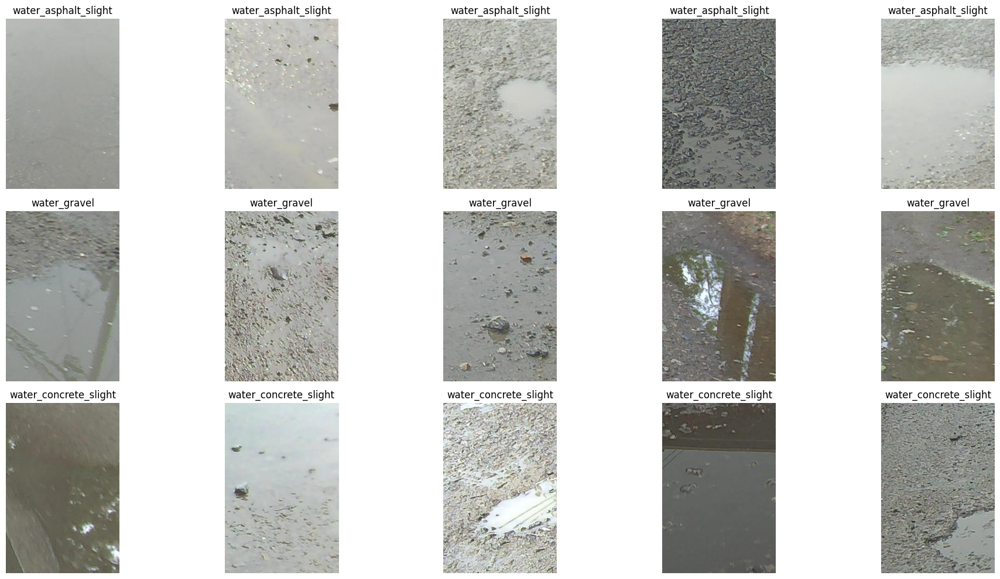

In [41]:
# Visualizing few images from each class in train dataset
visualize_samples(train_path)

## Checking for imbalances in datasets is very crucial to prevent model bias.

In [20]:
def class_distribution(folder):
   """
    Checking for imbalances in datasets is very crucial to prevent model bias.
    Calculate the distribution of classes in a given folder.

    Parameters:
    folder (str): The path to the folder containing the class directories.

    Returns:
    dict: A dictionary where the keys are the class names and the values are the number of files in each class directory.
    """
    distribution = {}
    for subdir, dirs, files in os.walk(folder):
        if not dirs:  # Check if the current directory is a class directory
            distribution[os.path.basename(subdir)] = len(files)
    return distribution

# Example usage
train_distribution = class_distribution(train_path) # Get the class distribution for the training dataset
print(train_distribution)


{'water_asphalt_slight': 4913, 'water_gravel': 6422, 'water_concrete_slight': 3924}


## Create Custom CNN Model Architecture

Convolutional Neural Networks (CNNs) are the go-to model for image classification tasks due to their ability to capture spatial hierarchies in images through the application of filters. This makes them especially suitable for recognizing textures and patterns unique to different road surfaces.

In [21]:
"""
Import necessary modules for building a convolutional neural network (CNN) model for image classification.
"""
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D


## Building the Convolutional Base

Model Architecture
1.	**Input Layer**: Take images of the road surface using Imagegenerator.
Since the original dimensions are (240, 360), and we want to use a target size of (224, 224).
Because, Training with 224x224 images reduces the computational load and memory usage compared to 240x360 images. The smaller the image, the fewer the number of parameters and operations required in your convolutional neural network, leading to faster training times and lower memory consumption.
The ImageDataGenerator's flow_from_directory method will automatically resize the images for us.
2.	**Convolutional Layers**: 3 layers with increasing filter sizes and depths to extract features.
3.	**Attention Mechanism**: Integrated within convolutional layers to focus on crucial features of road surfaces.
4.	**Fully Connected Layers**: To classify the extracted and focused features into the three categories.
5.	**Output Layer**: Softmax layer to output the probabilities of each road surface category.


In [22]:
# Function to create the convolutional base
def create_conv_base(input_shape):
    input_layer = Input(shape=input_shape) # Input layer

    # Convolutional layer 1
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_layer)
    x = MaxPooling2D((2, 2))(x) # Max pooling layer

    # Convolutional Layer 2
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x) # Max pooling layer

    # Convolutional Layer 3
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x) # Max pooling layer

    return Model(input_layer, x)    # Return the model


## Novelty Aspect : Attention Mechanism

We propose integrating a simple attention mechanism within the CNN to improve its performance. The attention mechanism allows the model to focus on specific parts of an image helping the model in distinguishing between similar textures like water_asphalt and water_concrete

In [23]:
def attach_attention_mechanism(conv_base):
    """
    Attaches an attention mechanism to the given convolutional base model.

    Parameters:
    conv_base (tf.keras.Model): The convolutional base model.

    Returns:
    tf.keras.Model: The model with the attention mechanism attached.
    """
    # Global average pooling layer
    attention_layer = GlobalAveragePooling2D()(conv_base.output)
    return Model(conv_base.input, attention_layer)


In [24]:
def add_classification_head(attention_model, num_classes):
    """
    Adds a classification head to the given attention model.

    Parameters:
    attention_model (Model): The attention model to add the classification head to.
    num_classes (int): The number of classes for the classification task.

    Returns:
    Model: The model with the added classification head.
    """
    x = Dense(256, activation='relu')(attention_model.output) # Dense layer with 256 units
    x = Dropout(0.5)(x)  # Dropout for regularization
    output_layer = Dense(num_classes, activation='softmax')(x) # Output layer with softmax activation

    return Model(attention_model.input, output_layer) # Return the model


In [25]:
input_shape = (image_height, image_width, 3)  # 3 channels for RGB
num_classes = 3  # water_asphalt, water_concrete, water_gravel

# Create the convolutional base
conv_base = create_conv_base(input_shape)
# Attach an attention mechanism to the convolutional base
attention_model = attach_attention_mechanism(conv_base)
# Add a classification head to the attention model
model = add_classification_head(attention_model, num_classes)

# Compile the model with an Adam optimizer, categorical crossentropy loss, and accuracy metric as the evaluation criteria
# Parameters: optimizer (str): The optimizer to use for training the model.
# loss (str): The loss function to use for the model.
# metrics (list): The evaluation criteria to use for the model.
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display the model summary
# The model summary provides a high-level overview of the model architecture, including the layers, output shapes, and number of parameters.
model.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       7385

## Set Up TensorBoard

In [26]:
"""
Load the tensorboard extension.

This code loads the tensorboard extension using the `%load_ext` magic command. Tensorboard is a visualization tool provided by TensorFlow that allows you to monitor and analyze your machine learning models. By loading the tensorboard extension, you can use tensorboard to visualize your model's performance and explore its internal workings.
"""
%load_ext tensorboard

## Initialize TensorBoard Callback

In [27]:
from keras.callbacks import TensorBoard
import datetime

In [28]:
"""
Creates a TensorBoard callback for logging training metrics.

Parameters:
- log_dir (str): The directory where the TensorBoard logs will be saved.
- histogram_freq (int): The frequency (in epochs) at which to compute activation and weight histograms for the layers of the model.

Returns:
- TensorBoard: The TensorBoard callback object.
"""
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)


## Train the Model with TensorBoard Callback

In [29]:

# Train the model using the training and validation generators for 20 epochs
epochs = 20

# Parameters: train_generator (ImageDataGenerator): The generator for training data.
# epochs (int): The number of epochs to train the model = 20
# validation_data (ImageDataGenerator): The generator for validation data.
# callbacks (list): The list of callbacks to apply during training.

history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=valid_generator,
    callbacks=[tensorboard_callback]
)

Epoch 1/20
477/477 [==============================] - 44s 77ms/step - loss: 1.0345 - accuracy: 0.4655 - val_loss: 0.9527 - val_accuracy: 0.5778
Epoch 2/20
477/477 [==============================] - 37s 78ms/step - loss: 0.9732 - accuracy: 0.5259 - val_loss: 0.9095 - val_accuracy: 0.6190
Epoch 3/20
477/477 [==============================] - 40s 85ms/step - loss: 0.8969 - accuracy: 0.5820 - val_loss: 0.8489 - val_accuracy: 0.6413
Epoch 4/20
477/477 [==============================] - 36s 76ms/step - loss: 0.8045 - accuracy: 0.6484 - val_loss: 0.7501 - val_accuracy: 0.6778
Epoch 5/20
477/477 [==============================] - 37s 78ms/step - loss: 0.7405 - accuracy: 0.6862 - val_loss: 0.7387 - val_accuracy: 0.6630
Epoch 6/20
477/477 [==============================] - 36s 75ms/step - loss: 0.6997 - accuracy: 0.7061 - val_loss: 0.6108 - val_accuracy: 0.7444
Epoch 7/20
477/477 [==============================] - 40s 84ms/step - loss: 0.6629 - accuracy: 0.7278 - val_loss: 0.7427 - val_accuracy:

In [30]:
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

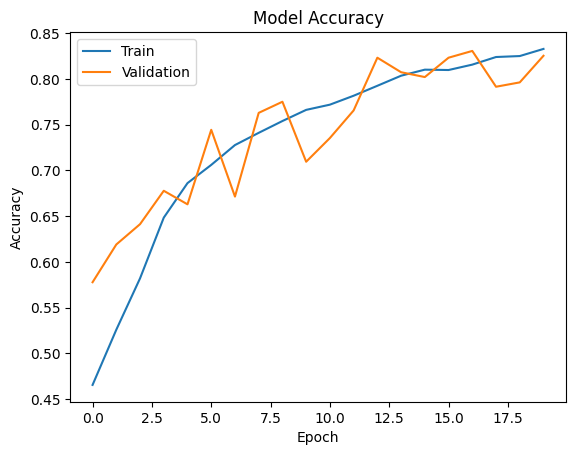

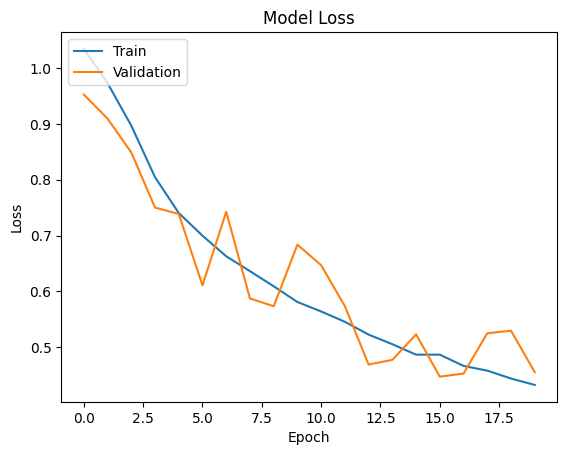

In [31]:
import matplotlib.pyplot as plt

# Summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


## Model Accuracy
The training accuracy curve shows a consistent upward trend, indicating that the model is learning and improving its performance on the training set over epochs.

The validation accuracy also increases, which is a positive sign that the model is generalizing well to unseen data. However, it appears to plateau toward the later epochs, suggesting that further gains in accuracy might require additional strategies like more data, further hyperparameter tuning, or possibly model architecture changes.

The validation accuracy follows the training accuracy closely, which is good.

## Model Loss
The training loss decreases sharply at first and then more gradually, which is typical and indicates that the model is effectively reducing error over time.
The validation loss decreases alongside the training loss, which suggests that the model is not memorizing the training data and is able to generalize its predictions to the validation set.

Towards the later epochs, both training and validation loss show slight fluctuations. The validation loss appears to have a slight upward trend towards the end, which might be an early sign of overfitting.

## Overall Assessment
The model is learning and improving its ability to classify the images over time. However, the divergence between training and validation accuracy and the slight uptick in validation loss towards the end could indicate that the model might start to overfit if trained for more epochs.

It's also possible that the model could benefit from regularization strategies like dropout, weight decay, or more extensive data augmentation to further improve generalization.

In [32]:
# Evaluate the model on the test data using `evaluate`
steps_per_epoch=len(test_generator)
print("\nEvaluating on test data:")
results = model.evaluate(test_generator, steps=steps_per_epoch)
print("test loss, test acc:", results)



Evaluating on test data:
75/75 [==============================] - 5s 71ms/step - loss: 0.4426 - accuracy: 0.8217
test loss, test acc: [0.442631334066391, 0.8216666579246521]


In [34]:
model.save('model.h5', save_format='tf')